In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.datasets import make_classification

In [17]:
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=20)

In [18]:
X.shape

(100, 2)

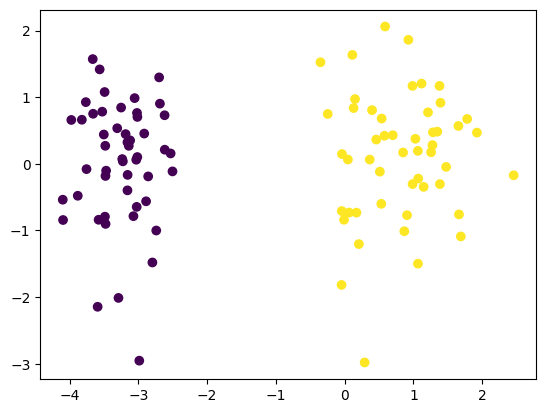

In [ ]:
plt.scatter(x=X[:,0],y=X[:,1],c=y)

In [20]:
def perceptron(X,y):
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
    return weights[0],weights[1:]

In [21]:
def step(z):
    return z if z > 0 else 0

In [22]:
_inter,_coff=perceptron(X,y)

In [23]:
_inter, _coff

(np.float64(0.7117180626821749), array([0.24011906, 0.05241882]))

In [24]:
m = -(_coff[0]/_coff[1])
b = -(_inter/_coff[1])

In [25]:
x_input = np.linspace(-3,3,100)
y_input = m * x_input + b

[]

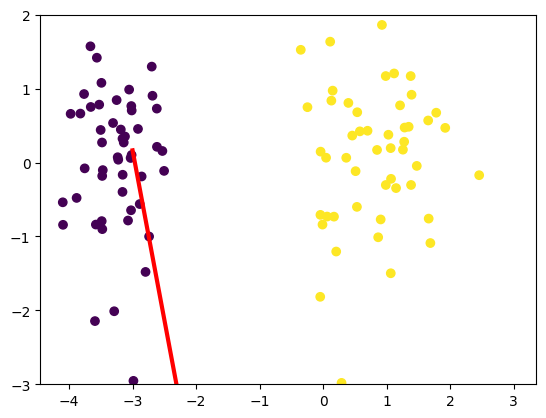

In [26]:
# plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color = "red",linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y)
plt.ylim(-3,2)
plt.plot()

In [13]:
def perceptron(X,y):
    
    m = []
    b = []
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
        
    return m,b

In [14]:
m,b = perceptron(X,y)

In [15]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from IPython.display import HTML

In [16]:
fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
line, = ax.plot(x_i, x_i*m[0] + b[0], 'r-', linewidth=2)

ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
plt.ylim(-3, 3)

def update(i):
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(f'Epoch {i+1}')
    return line,

anim = FuncAnimation(fig, update, frames=200, interval=100, blit=True)

plt.show()        # <-- Important

<IPython.core.display.Javascript object>

In [17]:
HTML(anim.to_jshtml())

In [27]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression()
lor.fit(X,y)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [28]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

In [29]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

(-3.0, 2.0)

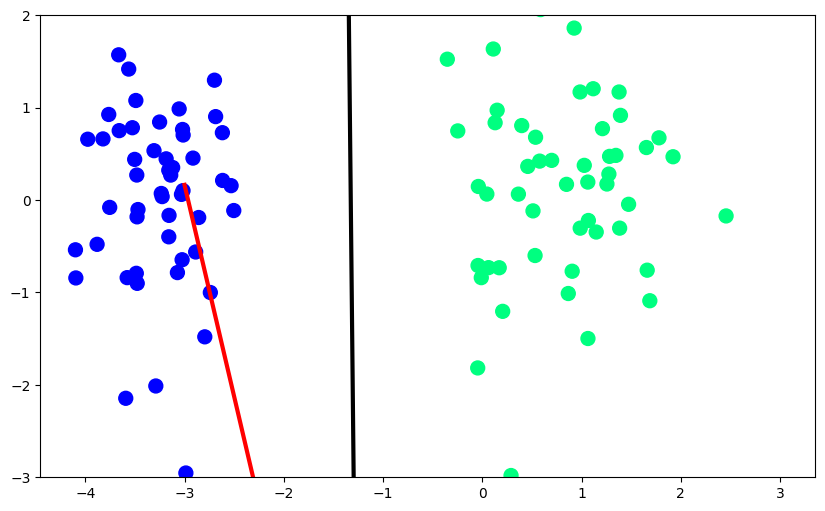

In [30]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)